# Fancy Visualizations for Classification Models

This notebooks is similiar to `slides_classification.ipynb`, except it has more visualizations of the models and parameters. This notebook requires packages like seaborn and yellowbrick.

- Stephen W. Thomas
- Used for MMA 869, MMAI 869, and GMMA 869

In [1]:
import datetime
print(datetime.datetime.now())

2020-10-06 08:59:43.921342


In [2]:
# Supress scikit-learn's deprecations warnings.

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

In [3]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns 

import itertools

import scipy

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\__init__.py:886: MatplotlibDeprecationWarning: 
examples.directory is deprecated; in the future, examples will be found relative to the 'datapath' directory.
  "found relative to the 'datapath' directory.".format(key))


# Load Data

In [4]:
df = pd.read_csv("../data/generated_marketing.csv")
df.info()
df.head()

feature_names = ['Age', 'Income']
X = df[feature_names].to_numpy()
y = df['Bought'].to_numpy()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Age     500 non-null    float64
 1   Income  500 non-null    float64
 2   Bought  500 non-null    int64  
dtypes: float64(2), int64(1)
memory usage: 11.8 KB


,Age,Income,Bought
0,0.748126,1.185890,0
1,-1.645760,-2.933332,1
2,0.279829,0.835401,0
3,0.195853,1.249209,0
4,-1.357053,-1.409123,1


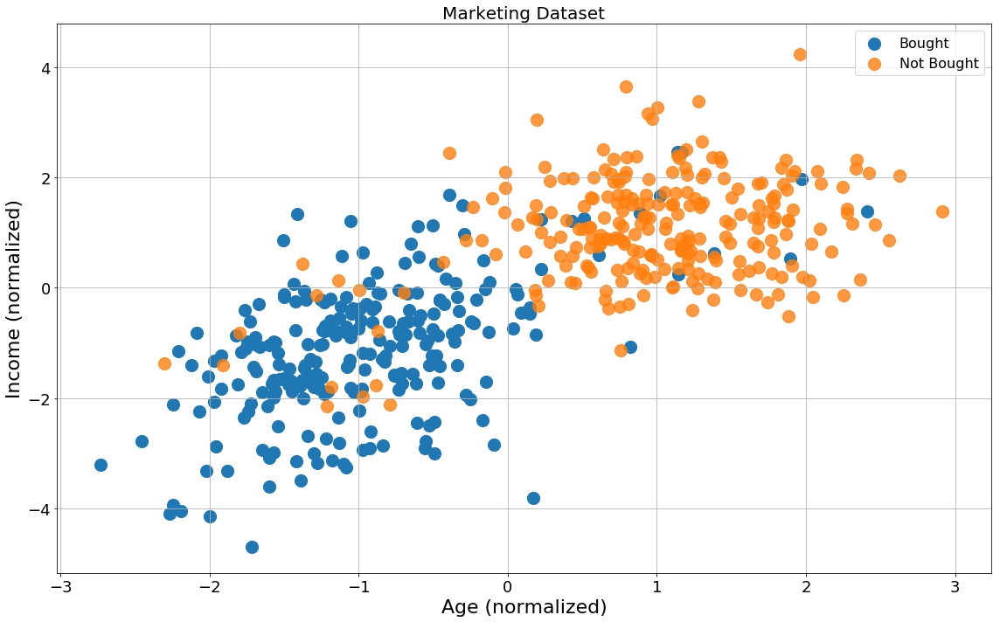

In [5]:
plt.figure(figsize=(16, 10));
plt.grid(True);

ind_d = y==1
ind_p = y==0
plt.scatter(X[ind_d,0], X[ind_d,1], marker='o', s=200, label='Bought');
plt.scatter(X[ind_p,0], X[ind_p,1], marker='o', s=200, label="Not Bought", alpha=0.8);

plt.legend(fontsize=16);
plt.title("Marketing Dataset", fontsize=20);
plt.xlabel('Age (normalized)', fontsize=22);
plt.ylabel('Income (normalized)', fontsize=22);
plt.xticks(fontsize=18);
plt.yticks(fontsize=18);
plt.tight_layout();
#plt.savefig('out/default-data.png');

## Plot the Data

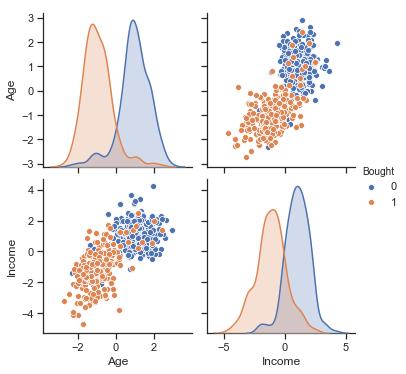

In [6]:
import seaborn as sns
sns.set(style="ticks")

sns.pairplot(df, hue="Bought");

# Splitting the Data

In [7]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Helper Functions for Plotting Decision Boundary, etc.

In [8]:
from matplotlib.colors import ListedColormap
from sklearn.metrics import roc_curve, auc

# Adopted from: https://scikit-learn.org/stable/auto_examples/classification/plot_classifier_comparison.html

def plot_boundaries(X_train, X_test, y_train, y_test, clf, clf_name, ax, hide_ticks=True):
    cm = plt.cm.RdBu
    cm_bright = ListedColormap(['#FF0000', '#0000FF'])

    X = np.concatenate((X_train, X_test), axis=0)
    y = np.concatenate((y_train, y_test), axis=0)
    
    x_min, x_max = X[:, 0].min() - .5, X[:, 0].max() + .5
    y_min, y_max = X[:, 1].min() - .5, X[:, 1].max() + .5
    xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.02), np.arange(y_min, y_max, 0.02));
    
    
    score = clf.score(X_test, y_test);

    # Plot the decision boundary. For that, we will assign a color to each
    # point in the mesh [x_min, x_max]x[y_min, y_max].
    if hasattr(clf, "decision_function"):
        Z = clf.decision_function(np.c_[xx.ravel(), yy.ravel()]);
    else:
        Z = clf.predict_proba(np.c_[xx.ravel(), yy.ravel()])[:, 1];

    # Put the result into a color plot
    Z = Z.reshape(xx.shape)
    ax.contourf(xx, yy, Z, cmap=cm, alpha=.8);

    # Plot the training points
    ax.scatter(X_train[:, 0], X_train[:, 1], c=y_train, s=100, cmap=cm_bright, edgecolors='k');
    # Plot the testing points
    ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, s=50, cmap=cm_bright, edgecolors='k', alpha=0.6);

    ax.set_xlim(xx.min(), xx.max());
    ax.set_ylim(yy.min(), yy.max());
    if hide_ticks:
        ax.set_xticks(());
        ax.set_yticks(());
    else:
        ax.tick_params(axis='both', which='major', labelsize=18)
        #ax.yticks(fontsize=18);
        
    ax.set_title(clf_name, fontsize=28);
    ax.text(xx.max() - .3, yy.min() + .3, ('%.2f' % score).lstrip('0'), size=35, horizontalalignment='right');
    ax.grid();
    
    


def plot_roc(clf, X_test, y_test, name, ax, show_thresholds=True):
    y_pred_rf = clf.predict_proba(X_test)[:, 1]
    fpr, tpr, thr = roc_curve(y_test, y_pred_rf)

    ax.plot([0, 1], [0, 1], 'k--');
    ax.plot(fpr, tpr, label='{}, AUC={:.2f}'.format(name, auc(fpr, tpr)));
    ax.scatter(fpr, tpr);

    if show_thresholds:
        for i, th in enumerate(thr):
            ax.text(x=fpr[i], y=tpr[i], s="{:.2f}".format(th), fontsize=14, 
                     horizontalalignment='left', verticalalignment='top', color='black',
                     bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.1', alpha=0.1));
        
    ax.set_xlabel('False positive rate', fontsize=18);
    ax.set_ylabel('True positive rate', fontsize=18);
    ax.tick_params(axis='both', which='major', labelsize=18);
    ax.grid(True);
    ax.set_title('ROC Curve', fontsize=18)

# Decision Trees

In [9]:
from sklearn.tree import DecisionTreeClassifier

clf = DecisionTreeClassifier(random_state=42, criterion="entropy",
                             min_samples_split=10, min_samples_leaf=10, max_depth=3, max_leaf_nodes=5)
clf.fit(X_train, y_train)

y_pred_dt = clf.predict(X_test)

DecisionTreeClassifier(criterion='entropy', max_depth=3, max_leaf_nodes=5,
                       min_samples_leaf=10, min_samples_split=10,
                       random_state=42)

In [10]:
class_names = [str(x) for x in clf.classes_]

## Use the Model to Predict Someone New

In [11]:
clf.predict_proba([[2, 2]])
clf.predict([[2, 2]])

array([[0.93922652, 0.06077348]])

array([0], dtype=int64)

## Model Parameters

Surpisingly, sci-kit learn does not have a function to print the decision tree in text format. (It does have a way to graphical render the three, which we'll do later.) For now, we'll just print a few stats about the tree.

In [12]:
print(clf.tree_.node_count)
print(clf.tree_.impurity)
print(clf.tree_.children_left)
print(clf.tree_.threshold)

9
[0.99971144 0.40077522 0.45449306 0.99107606 0.33050773 0.22746906
 0.83147439 0.28998605 0.        ]
[ 1  5  3 -1 -1  7 -1 -1 -1]
[-0.05775159 -0.15540861  0.2254563  -2.         -2.         -0.7764757
 -2.         -2.         -2.        ]


## Model Performance

In [13]:
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred_dt, target_names=class_names))

              precision    recall  f1-score   support

           0       0.91      0.91      0.91        55
           1       0.89      0.89      0.89        45

    accuracy                           0.90       100
   macro avg       0.90      0.90      0.90       100
weighted avg       0.90      0.90      0.90       100



In [14]:
from sklearn.metrics import accuracy_score, cohen_kappa_score, f1_score, log_loss

print("Accuracy = {:.2f}".format(accuracy_score(y_test, y_pred_dt)))
print("Kappa = {:.2f}".format(cohen_kappa_score(y_test, y_pred_dt)))
print("F1 Score = {:.2f}".format(f1_score(y_test, y_pred_dt)))
print("Log Loss = {:.2f}".format(log_loss(y_test, y_pred_dt)))

Accuracy = 0.90
Kappa = 0.80
F1 Score = 0.89
Log Loss = 3.45


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\__init__.py:886: MatplotlibDeprecationWarning: 
examples.directory is deprecated; in the future, examples will be found relative to the 'datapath' directory.
  "found relative to the 'datapath' directory.".format(key))


ClassificationReport(ax=<matplotlib.axes._subplots.AxesSubplot object at 0x000001FACE715CF8>,
                     cmap=<matplotlib.colors.ListedColormap object at 0x000001FACE7DEC50>,
                     model=None, support=True)

0.9

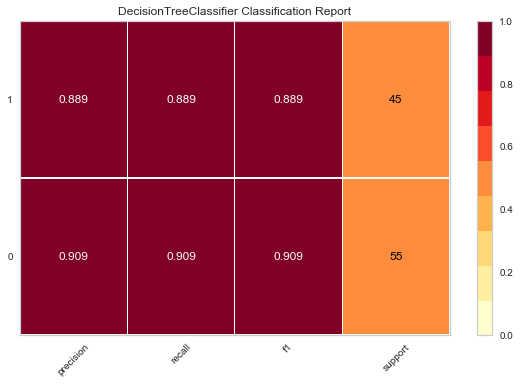

In [15]:
from yellowbrick.classifier import ClassificationReport

# Instantiate the classification model and visualizer
visualizer = ClassificationReport(clf, classes=class_names, support=True)

visualizer.fit(X_train, y_train)  # Fit the visualizer and the model
visualizer.score(X_test, y_test)  # Evaluate the model on the test data
g = visualizer.poof()             # Draw/show/poof the data

ClassPredictionError(ax=<matplotlib.axes._subplots.AxesSubplot object at 0x000001FACE85AD68>,
                     model=None)

0.9

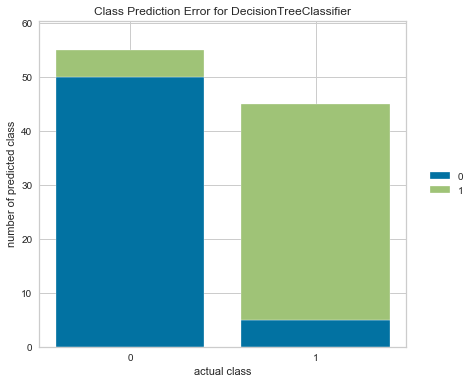

In [16]:
from yellowbrick.classifier import ClassPredictionError

visualizer = ClassPredictionError(clf, classes=class_names)

visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
g = visualizer.poof()

### ROC Curve

#### With YellowBrick

ROCAUC(ax=<matplotlib.axes._subplots.AxesSubplot object at 0x000001FACE933860>,
       model=None)

0.9

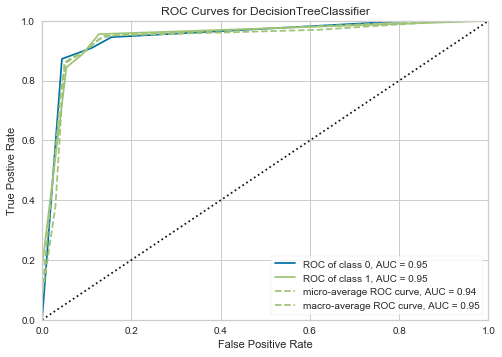

In [17]:
from yellowbrick.classifier import ROCAUC

visualizer = ROCAUC(clf, classes=class_names)

visualizer.fit(X_train, y_train)  # Fit the training data to the visualizer
visualizer.score(X_test, y_test)  # Evaluate the model on the test data
g = visualizer.poof()             # Draw/show/poof the data

#### Manual

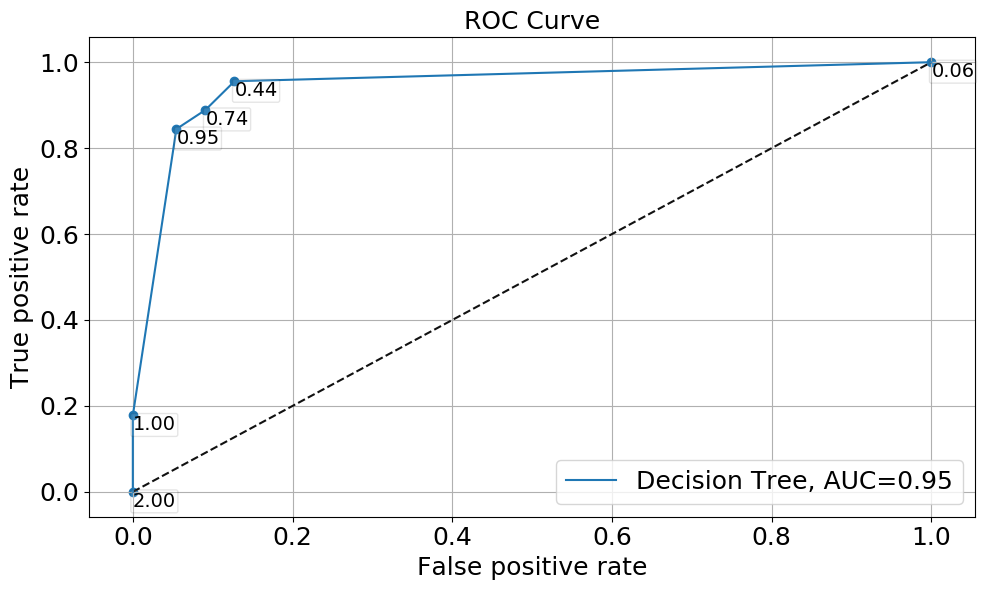

In [18]:
plt.style.use('default');
figure = plt.figure(figsize=(10, 6));    
ax = plt.subplot(1, 1, 1);
plot_roc(clf, X_test, y_test, "Decision Tree", ax)
plt.legend(loc='lower right', fontsize=18);
plt.tight_layout();
plt.savefig('out/default-dt-roc.png');

### Precision Recall Curve

#### With YellowBrick

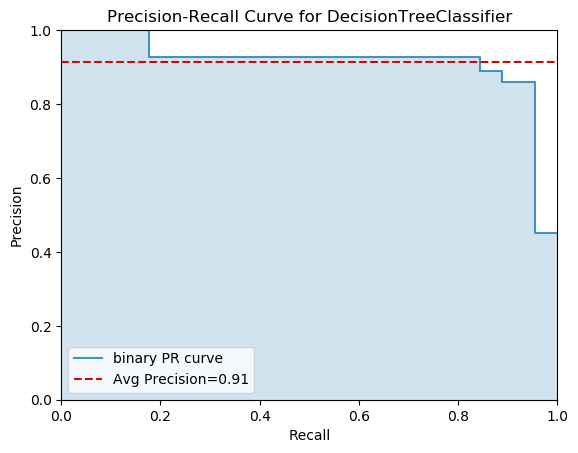

In [19]:
from yellowbrick.classifier import PrecisionRecallCurve

viz = PrecisionRecallCurve(clf);
viz.fit(X_train, y_train);
viz.score(X_test, y_test);
viz.poof();

### Discrimintation Threshold

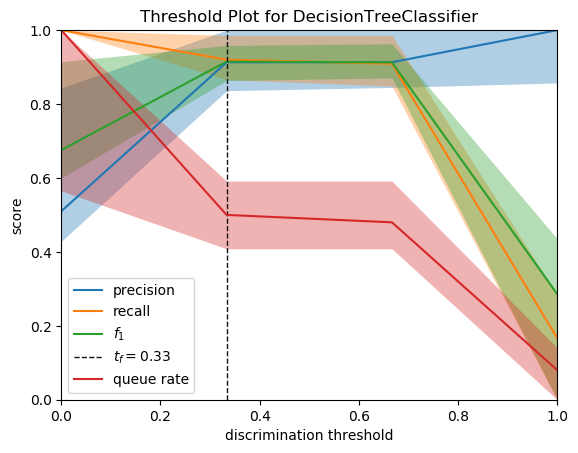

In [20]:
from yellowbrick.classifier import DiscriminationThreshold

visualizer = DiscriminationThreshold(clf);
visualizer.fit(X, y);  # Fit the training data to the visualizer
visualizer.poof();     # Draw/show/poof the data

## Model Visualization

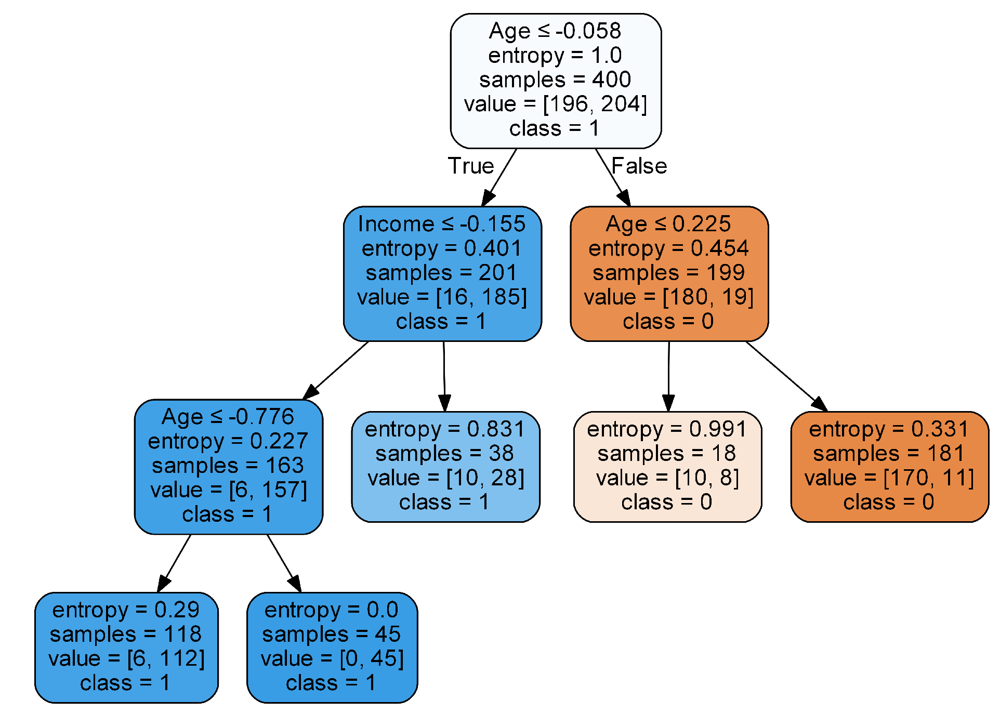

In [21]:
from sklearn.tree import export_graphviz 
import graphviz

base='out/default_dt_graph'
dot = base + '.dot'
png = base + '.png'

dot_data = export_graphviz(clf, out_file=dot, feature_names=feature_names, class_names=class_names,  
                      filled=True, rounded=True, special_characters=True,
                      leaves_parallel=False, proportion=False)  
graph = graphviz.Source(dot_data)  

from subprocess import call
call(['dot', '-Tpng', dot, '-o', png, '-Gdpi=600'])


# Display in python
import matplotlib.pyplot as plt
plt.figure(figsize = (24, 28));
plt.imshow(plt.imread(png));
plt.axis('off');
plt.show();

In [22]:
import importlib
spec = importlib.util.find_spec("dtreeviz")
dtreeviz_found = spec is not None

if dtreeviz_found:
    from dtreeviz.trees import *

    viz = dtreeviz(clf, X, y, target_name='Default', feature_names=feature_names, class_names=class_names, orientation ='LR'); 
    #viz.save('out/default_dt_dtreeviz1.svg')
    viz
else:
    print("dtreeviz not installed on this system.")

dtreeviz not installed on this system.


In [23]:
if dtreeviz_found:
    viz = dtreeviz(clf, X, y, target_name='Default', feature_names=feature_names, class_names=class_names, orientation ='TD', fancy=False);
    viz.save('out/default_dt_dtreeviz2.svg')
    viz
else:
    print("dtreeviz not installed on this system.")

dtreeviz not installed on this system.


In [24]:

if dtreeviz_found:
    # Select a random sample
    x = X_train[13,:] 
    print(x)
    print(y_train[13])

    viz = dtreeviz(clf, X_train, y_train, target_name='default', feature_names=feature_names, class_names=class_names, orientation ='LR', X=x); 
    viz

else:
    print("dtreeviz not installed on this system.")

dtreeviz not installed on this system.


### Decision Boundary

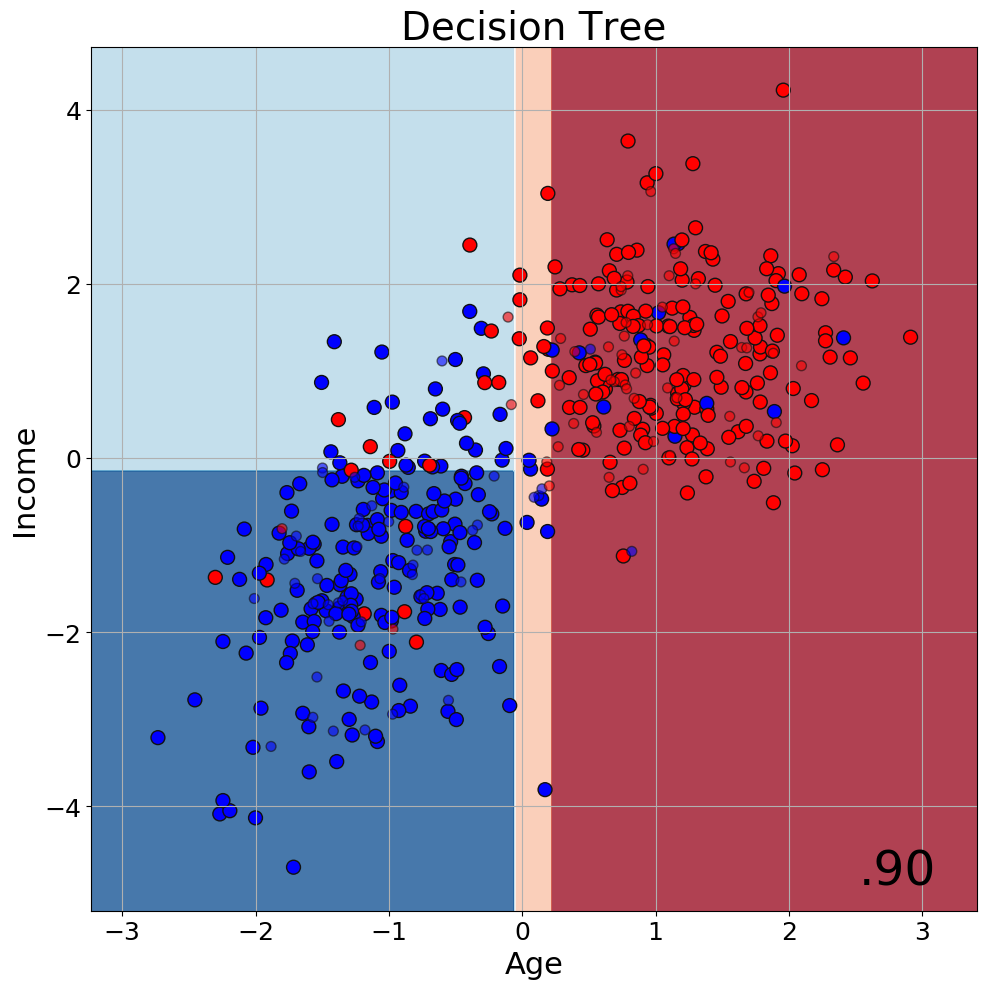

In [25]:
figure = plt.figure(figsize=(10, 10));
ax = plt.subplot(1, 1, 1);
plot_boundaries(X_train, X_test, y_train, y_test, clf, "Decision Tree", ax, hide_ticks=False)
ax.set_xlabel("Age", fontsize=22)
ax.set_ylabel("Income", fontsize=22)
plt.tight_layout();
#plt.savefig('out/default-dt-5-boundaries.png');

# Naive Bayes

In [26]:
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
gnb = gnb.fit(X_train, y_train)

y_pred_gnb = gnb.predict(X_test)

## Model Parameters

In [27]:
gnb.theta_ # Mean of each feature per class
gnb.sigma_ # Variance of each feature per class

array([[ 0.99887777,  1.06512859],
       [-0.91827636, -1.08561939]])

array([[0.70142311, 0.949339  ],
       [0.62737657, 1.68858577]])

## Model Performance

DiscriminationThreshold(ax=<matplotlib.axes._subplots.AxesSubplot object at 0x000001FAC8F6CC50>,
                        model=None)

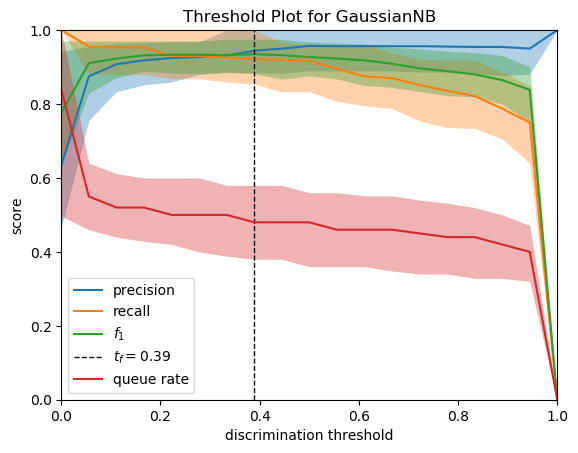

In [28]:
from yellowbrick.classifier import DiscriminationThreshold

visualizer = DiscriminationThreshold(gnb)
visualizer.fit(X, y)  # Fit the training data to the visualizer
visualizer.poof()     # Draw/show/poof the data

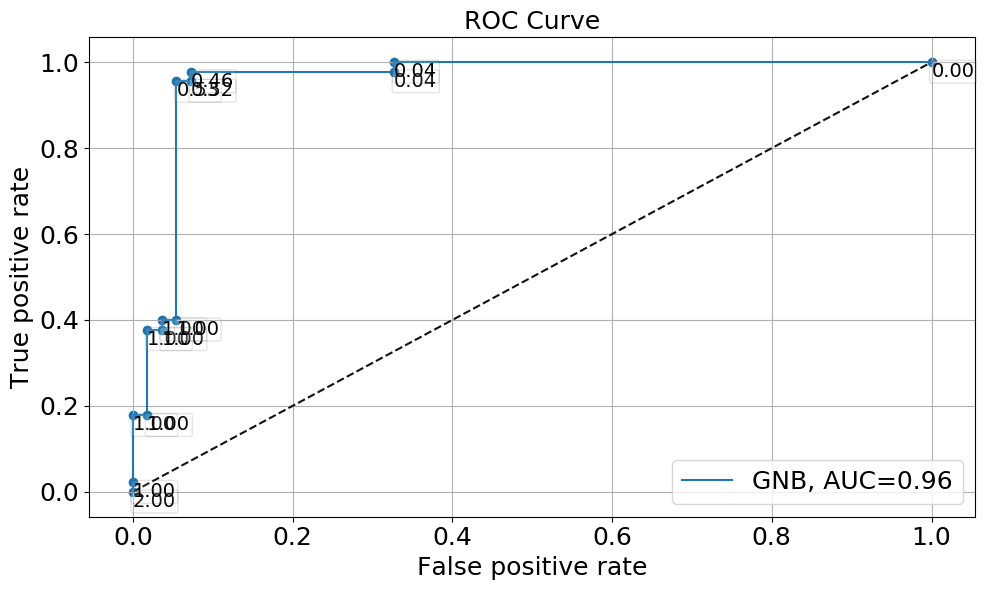

In [29]:
plt.style.use('default');
figure = plt.figure(figsize=(10, 6));    
ax = plt.subplot(1, 1, 1);
plot_roc(gnb, X_test, y_test, "GNB", ax)
plt.legend(loc='lower right', fontsize=18);
plt.tight_layout();
#plt.savefig('out/default-gnb-roc.png');

## Model Visualization

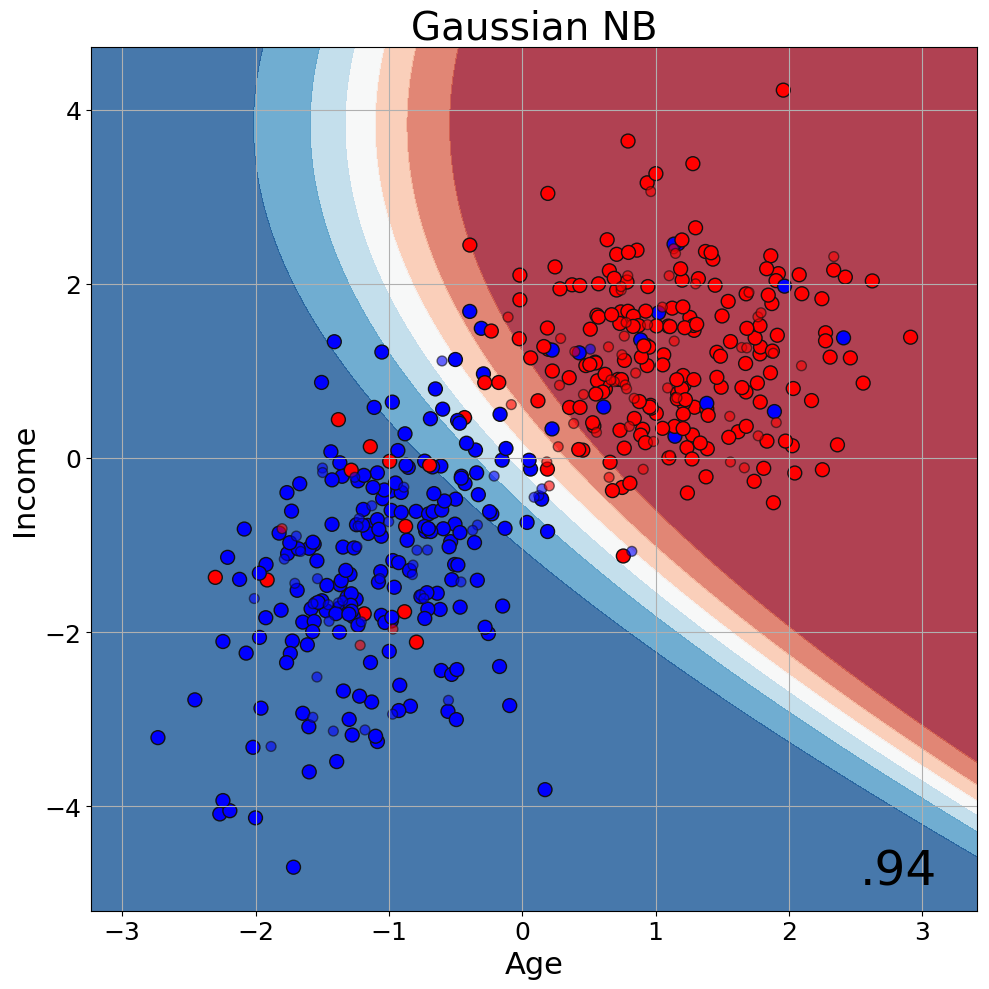

In [30]:
figure = plt.figure(figsize=(10, 10));
ax = plt.subplot(1, 1, 1);
plot_boundaries(X_train, X_test, y_train, y_test, gnb, "Gaussian NB", ax, hide_ticks=False)
ax.set_xlabel("Age", fontsize=22)
ax.set_ylabel("Income", fontsize=22)
plt.tight_layout();
#plt.savefig('out/default-gnb-boundaries.png');

# KNN

In [31]:
from sklearn.neighbors import KNeighborsClassifier

knn_clf = KNeighborsClassifier(n_neighbors=3)
knn_clf.fit(X_train, y_train)

y_pred_knn = knn_clf.predict(X_test)

KNeighborsClassifier(n_neighbors=3)

## Model Parameters

In [32]:
knn_clf.effective_metric_
knn_clf.effective_metric_params_

'euclidean'

{}

## Model Performance

DiscriminationThreshold(ax=<matplotlib.axes._subplots.AxesSubplot object at 0x000001FACE631C88>,
                        model=None)

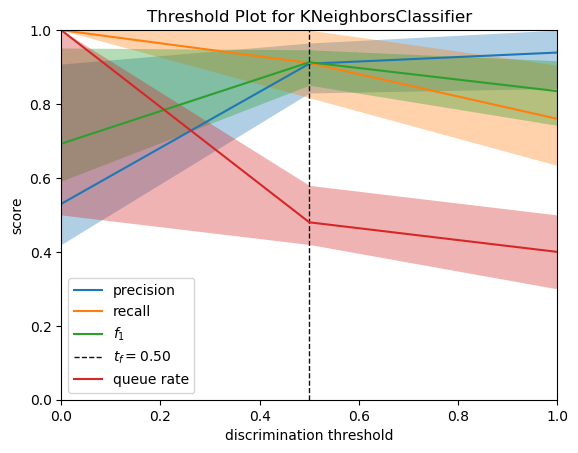

In [33]:
from yellowbrick.classifier import DiscriminationThreshold

visualizer = DiscriminationThreshold(knn_clf)
visualizer.fit(X, y)  # Fit the training data to the visualizer
visualizer.poof()     # Draw/show/poof the data

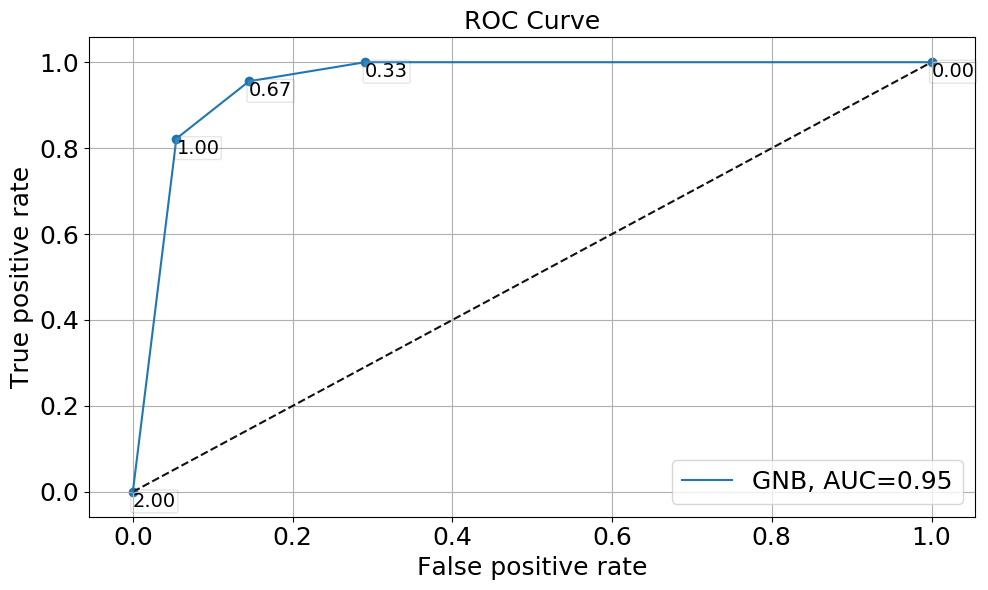

In [34]:
plt.style.use('default');
figure = plt.figure(figsize=(10, 6));    
ax = plt.subplot(1, 1, 1);
plot_roc(knn_clf, X_test, y_test, "GNB", ax)
plt.legend(loc='lower right', fontsize=18);
plt.tight_layout();
#plt.savefig('out/default-knn-roc.png');

## Model Visualization

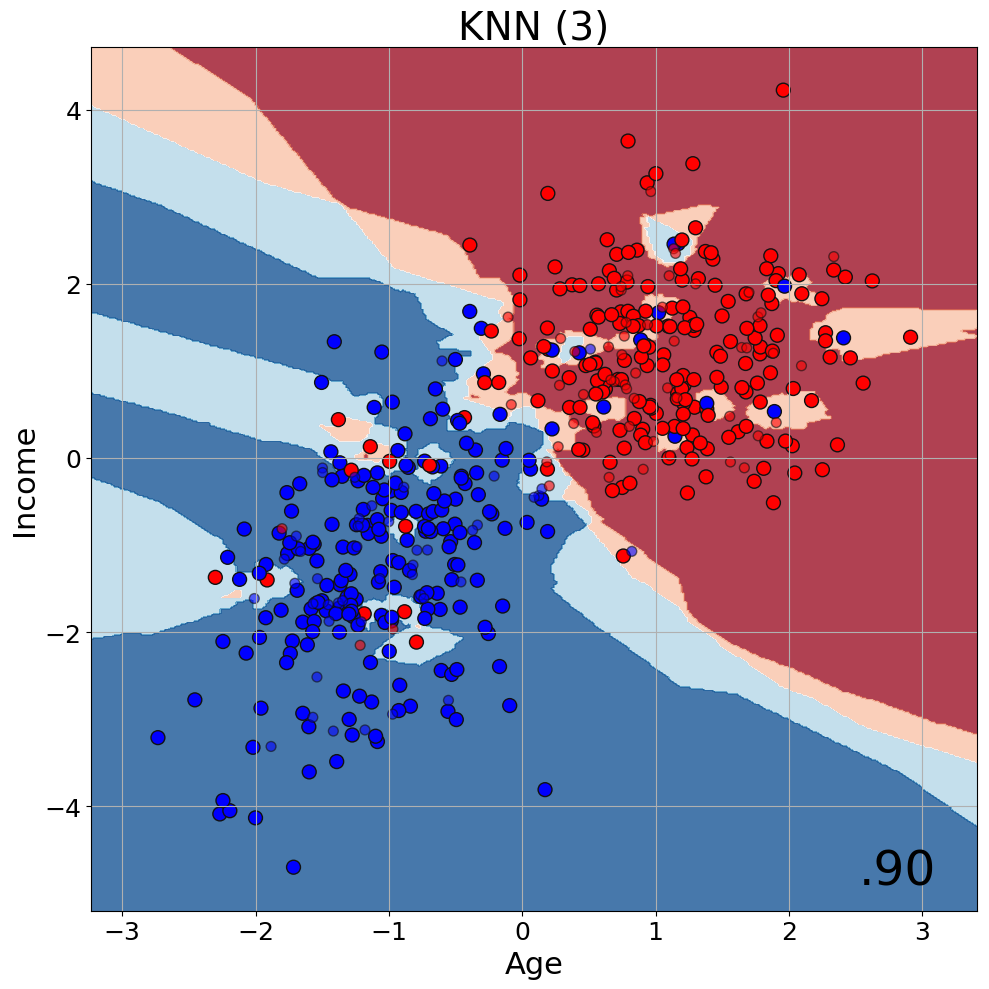

In [35]:
figure = plt.figure(figsize=(10, 10));
ax = plt.subplot(1, 1, 1);
plot_boundaries(X_train, X_test, y_train, y_test, knn_clf, "KNN (3)", ax, hide_ticks=False)
ax.set_xlabel("Age", fontsize=22)
ax.set_ylabel("Income", fontsize=22)
plt.tight_layout();
#plt.savefig('out/default-knn-boundaries.png');

## Experimenting with Lots of Ks

ValidationCurve(ax=<matplotlib.axes._subplots.AxesSubplot object at 0x000001FACE8023C8>,
                cv=5, model=None, param_name='n_neighbors',
                param_range=array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24]),
                scoring='roc_auc')

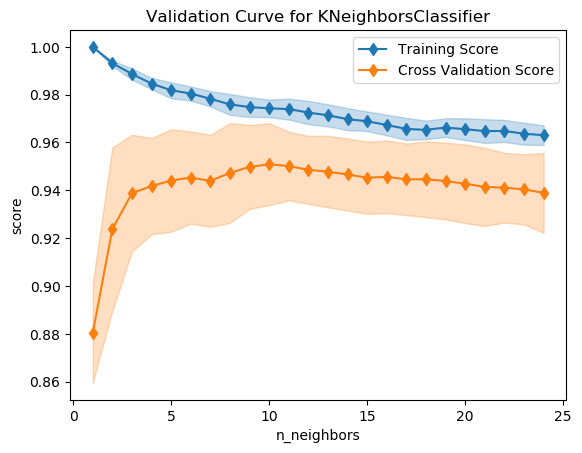

In [36]:
from yellowbrick.model_selection import ValidationCurve

viz = ValidationCurve(KNeighborsClassifier(), param_name="n_neighbors", param_range=np.arange(1, 25), cv=5, scoring="roc_auc")
viz.fit(X, y)
#viz.poof(outpath='out/default-knn-validation.png')
viz.poof()

# SVM - Linear

In [37]:
from sklearn.svm import SVC

svm_clf = SVC(kernel="linear", C=0.025)
svm_clf.fit(X_train, y_train)

y_pred_svm = svm_clf.predict(X_test)

SVC(C=0.025, kernel='linear')

## Model Parameters

In [38]:
svm_clf.n_support_

array([70, 69])

In [39]:
svm_clf.support_vectors_

array([[-2.30188062e+00, -1.37169280e+00],
       [-1.18486685e+00, -1.79040549e+00],
       [ 6.59102878e-01, -4.92594995e-02],
       [ 1.88977492e-01,  1.49340633e+00],
       [ 6.32255404e-02,  1.15016778e+00],
       [ 1.23912826e+00, -4.01893060e-01],
       [ 7.49980152e-01, -3.38768128e-01],
       [ 1.23622216e+00,  1.18585351e-01],
       [ 7.19460491e-01,  9.02795935e-01],
       [ 1.95852933e-01,  1.24920912e+00],
       [ 6.24289241e-01,  7.92790019e-01],
       [ 6.76905028e-01, -3.75127816e-01],
       [ 9.03792039e-01,  3.30215452e-01],
       [ 1.27385324e+00, -1.12810817e-02],
       [-8.82249296e-01, -1.76640750e+00],
       [-2.19281611e-02,  1.37013900e+00],
       [ 6.18149343e-01,  8.72452885e-01],
       [ 7.33559474e-01,  3.18524739e-01],
       [ 5.64698788e-01,  8.86571007e-01],
       [-1.13932834e+00,  1.30141500e-01],
       [ 8.88865699e-01,  2.62250487e-01],
       [-1.37872953e+00,  4.40826598e-01],
       [ 8.41265426e-01,  4.54384311e-01],
       [ 1.

In [40]:
svm_clf.dual_coef_ 

array([[-0.025     , -0.025     , -0.025     , -0.025     , -0.025     ,
        -0.025     , -0.025     , -0.025     , -0.025     , -0.025     ,
        -0.025     , -0.025     , -0.025     , -0.025     , -0.025     ,
        -0.025     , -0.025     , -0.025     , -0.025     , -0.025     ,
        -0.025     , -0.025     , -0.025     , -0.00055246, -0.025     ,
        -0.025     , -0.025     , -0.025     , -0.025     , -0.025     ,
        -0.025     , -0.025     , -0.025     , -0.025     , -0.025     ,
        -0.025     , -0.025     , -0.025     , -0.025     , -0.025     ,
        -0.025     , -0.025     , -0.025     , -0.025     , -0.025     ,
        -0.025     , -0.025     , -0.025     , -0.025     , -0.025     ,
        -0.025     , -0.025     , -0.025     , -0.025     , -0.025     ,
        -0.025     , -0.025     , -0.025     , -0.025     , -0.025     ,
        -0.025     , -0.025     , -0.025     , -0.01900603, -0.025     ,
        -0.025     , -0.025     , -0.025     , -0.0

In [41]:
svm_clf.intercept_ 

array([0.0853027])

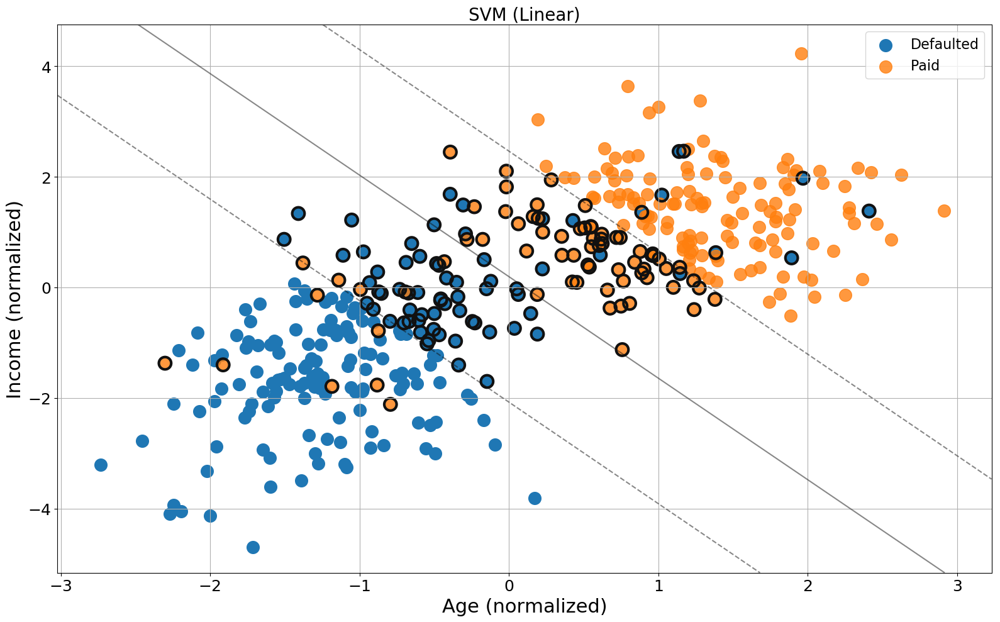

In [42]:
plt.figure(figsize=(16, 10));
plt.grid(True);

ind_d = y_train==1
ind_p = y_train==0
plt.scatter(X_train[ind_d,0], X_train[ind_d,1], marker='o', s=200, label='Defaulted');
plt.scatter(X_train[ind_p,0], X_train[ind_p,1], marker='o', s=200, label="Paid", alpha=0.8);

# plot the decision function
ax = plt.gca()
xlim = ax.get_xlim()
ylim = ax.get_ylim()

# create grid to evaluate model
xx = np.linspace(xlim[0], xlim[1], 30)
yy = np.linspace(ylim[0], ylim[1], 30)
YY, XX = np.meshgrid(yy, xx)
xy = np.vstack([XX.ravel(), YY.ravel()]).T
Z = svm_clf.decision_function(xy).reshape(XX.shape)

# plot decision boundary and margins
ax.contour(XX, YY, Z, colors='k', levels=[-1, 0, 1], alpha=0.5, linestyles=['--', '-', '--'])

# plot support vectors
plt.scatter(svm_clf.support_vectors_[:, 0], svm_clf.support_vectors_[:, 1], s=200, linewidth=3, facecolors='none', edgecolors='k')

plt.legend(fontsize=16);
plt.title("SVM (Linear)", fontsize=20);
plt.xlabel('Age (normalized)', fontsize=22);
plt.ylabel('Income (normalized)', fontsize=22);
plt.xticks(fontsize=18);
plt.yticks(fontsize=18);
plt.tight_layout();
#plt.savefig('out/default-svm-support-vectors.png');

## Model Visualization

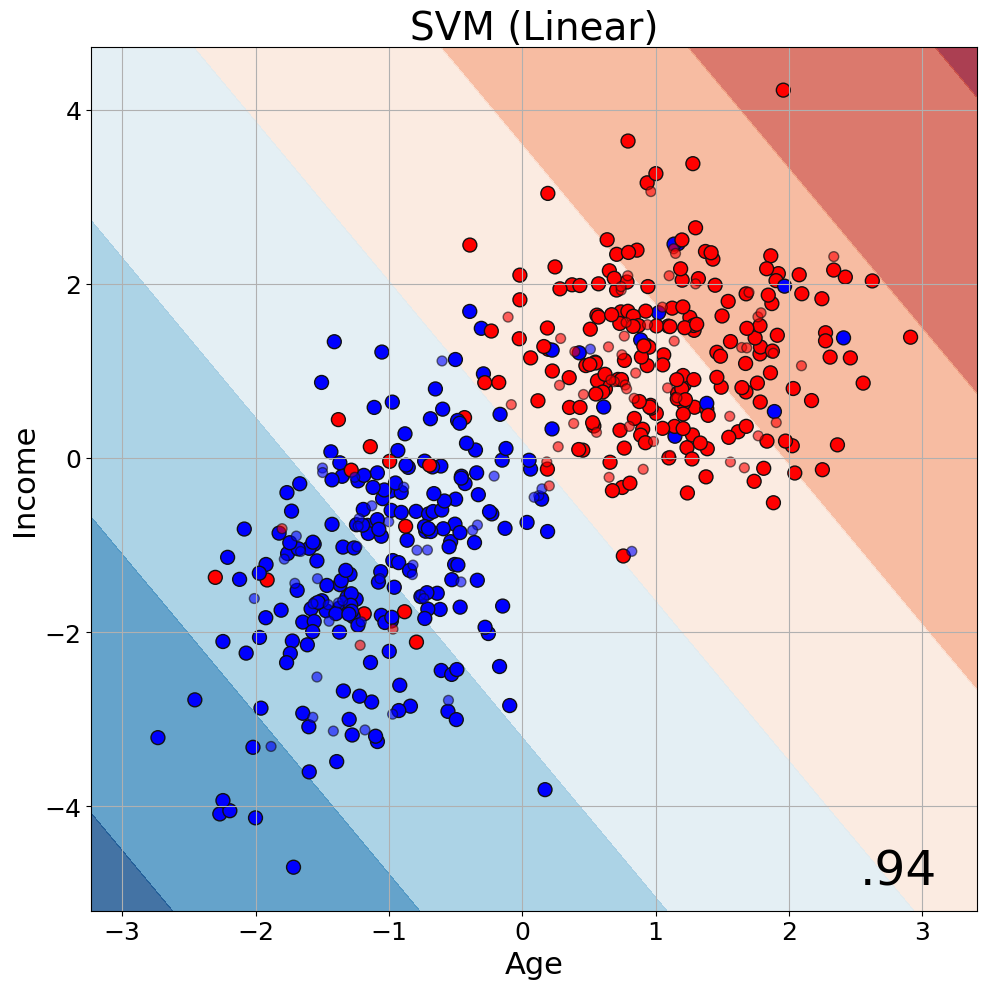

In [43]:
figure = plt.figure(figsize=(10, 10));
ax = plt.subplot(1, 1, 1);
plot_boundaries(X_train, X_test, y_train, y_test, svm_clf, "SVM (Linear)", ax, hide_ticks=False)
ax.set_xlabel("Age", fontsize=22)
ax.set_ylabel("Income", fontsize=22)
plt.tight_layout();
#plt.savefig('out/default-svm-linear-boundaries.png');

## Experimenting with Different Kernels

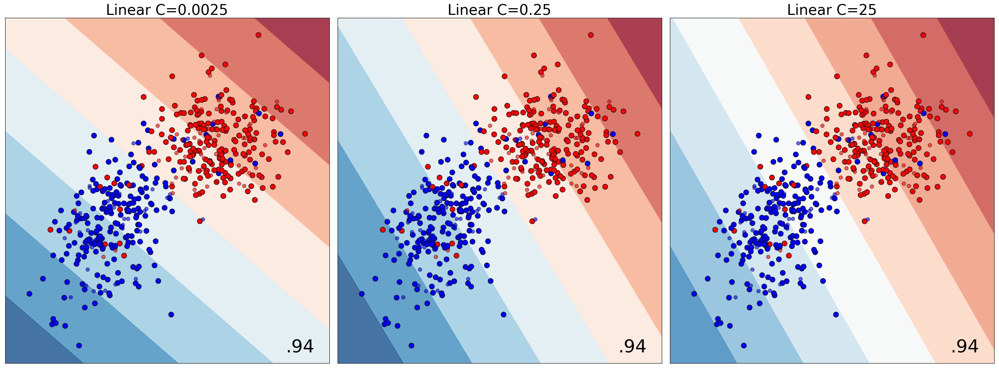

In [44]:
names = ["Linear C=0.0025", "Linear C=0.25", "Linear C=25"]

classifiers = [
    SVC(kernel="linear", C=0.0025),
    SVC(kernel="linear", C=0.25),
    SVC(kernel="linear", C=25),
]

rng = np.random.RandomState(2)

figure = plt.figure(figsize=(27, 10));
i = 1

# iterate over classifiers
for name, clf_tmp in zip(names, classifiers):
    ax = plt.subplot(1, 3, i);
    clf_tmp.fit(X_train, y_train);
    plot_boundaries(X_train, X_test, y_train, y_test, clf_tmp, name, ax, hide_ticks=True);
    i += 1

plt.tight_layout();
#plt.savefig('out/default-svm-linear-all.png');

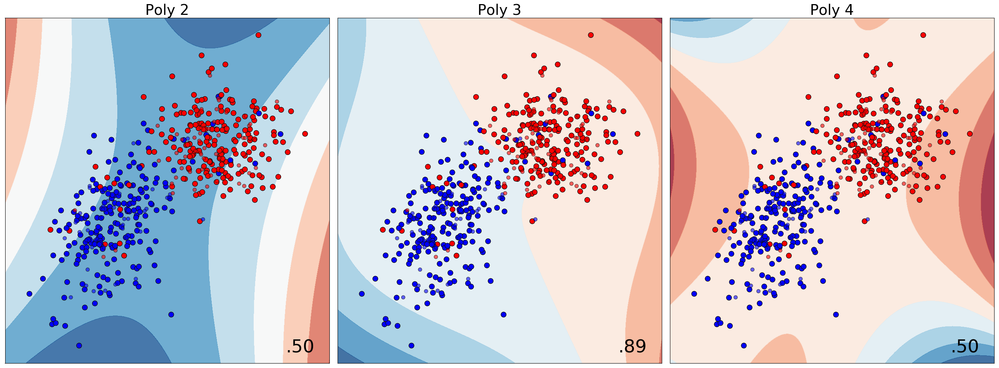

In [45]:
names = ["Poly 2", "Poly 3", "Poly 4"]

classifiers = [
    SVC(kernel="poly", degree=2, C=0.25),
    SVC(kernel="poly", degree=3, C=1),
    SVC(kernel="poly", degree=4, C=1),
]

rng = np.random.RandomState(2)

figure = plt.figure(figsize=(27, 10));
i = 1

# iterate over classifiers
for name, clf_tmp in zip(names, classifiers):
    ax = plt.subplot(1, 3, i);
    clf_tmp.fit(X_train, y_train);
    plot_boundaries(X_train, X_test, y_train, y_test, clf_tmp, name, ax, hide_ticks=True);
    i += 1

plt.tight_layout();
#plt.savefig('out/default-svm-poly-all.png');

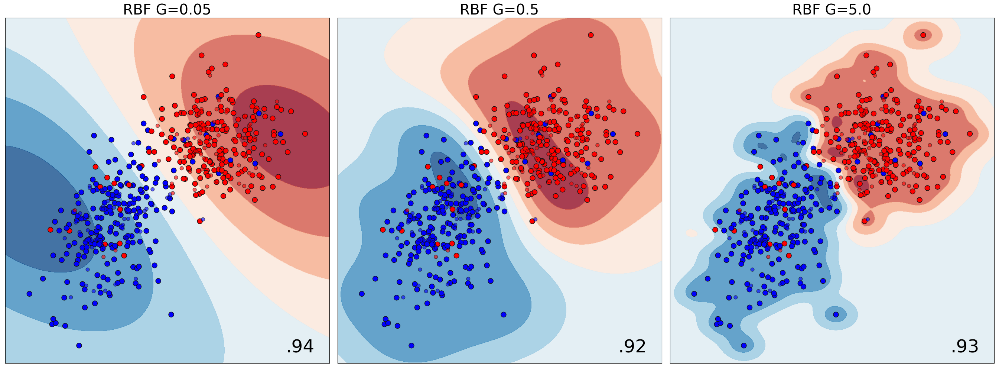

In [46]:
names = ["RBF G=0.05", "RBF G=0.5", "RBF G=5.0"]

classifiers = [
    SVC(kernel="rbf", gamma=0.05, C=1),
    SVC(kernel="rbf", gamma=0.5, C=1),
    SVC(kernel="rbf", gamma=5.0, C=1),
]

rng = np.random.RandomState(2)

figure = plt.figure(figsize=(27, 10));
i = 1

# iterate over classifiers
for name, clf_tmp in zip(names, classifiers):
    ax = plt.subplot(1, 3, i);
    clf_tmp.fit(X_train, y_train);
    plot_boundaries(X_train, X_test, y_train, y_test, clf_tmp, name, ax, hide_ticks=True);
    i += 1

plt.tight_layout();
#plt.savefig('out/default-svm-rbf-all.png');

# NN

In [47]:
from sklearn.neural_network import MLPClassifier

nn_clf = MLPClassifier(solver='lbfgs', activation='relu', alpha=1e-3, 
                       hidden_layer_sizes=(3), random_state=1, verbose=True)
nn_clf.fit(X_train, y_train)

y_pred_nn = nn_clf.predict(X_test)

MLPClassifier(alpha=0.001, hidden_layer_sizes=3, random_state=1, solver='lbfgs',
              verbose=True)

## Model Parameters

In [48]:
nn_clf.loss_

0.2710649521744611

In [49]:
nn_clf.n_layers_

3

In [50]:
w = nn_clf.coefs_ # The ith element in the list represents the weight matrix corresponding to layer i.
w

[array([[ 0.97565261,  1.08832584, -1.04406553],
        [-1.66548065, -1.62569206, -0.61746919]]),
 array([[ 3.91733103],
        [-2.57062872],
        [ 1.76672827]])]

In [51]:
b = nn_clf.intercepts_ # The ith element in the list represents the bias vector corresponding to layer i + 1.
b

[array([-2.08114864, -1.191515  ,  1.62527184]), array([-2.59817514])]

In [52]:
nn_clf.out_activation_

'logistic'

In [53]:
nn_clf.predict_proba([[0.5, 1]])

array([[0.85068094, 0.14931906]])

In [54]:
def relu_af(x):
    return max(0, x)
    
x = [0.5, 1]

layer_id=0
h0 = (x[0] * w[layer_id][0][0]) + ((x[1] * w[layer_id][1][0])) + (1 * b[layer_id][0])
print(h0)
print(relu_af(h0))

h1 = (x[0] * w[layer_id][0][1]) + ((x[1] * w[layer_id][1][1])) + (1 * b[layer_id][1])
print(h1)
print(relu_af(h1))

h2 = (x[0] * w[layer_id][0][2]) + ((x[1] * w[layer_id][1][2])) + (1 * b[layer_id][2])
print(h2)
print(relu_af(h2))

layer_id=1
o = (h0 * w[layer_id][0][0]) + ((h1 * w[layer_id][1][0])) + ((h2 * w[layer_id][2][0])) + (1 * b[layer_id][0])
print(o)
print(relu_af(o))

-3.258802985079457
0
-2.2730441410463937
0
0.485769881383316
0.485769881383316
-8.662609272361532
0


## Model Visualization

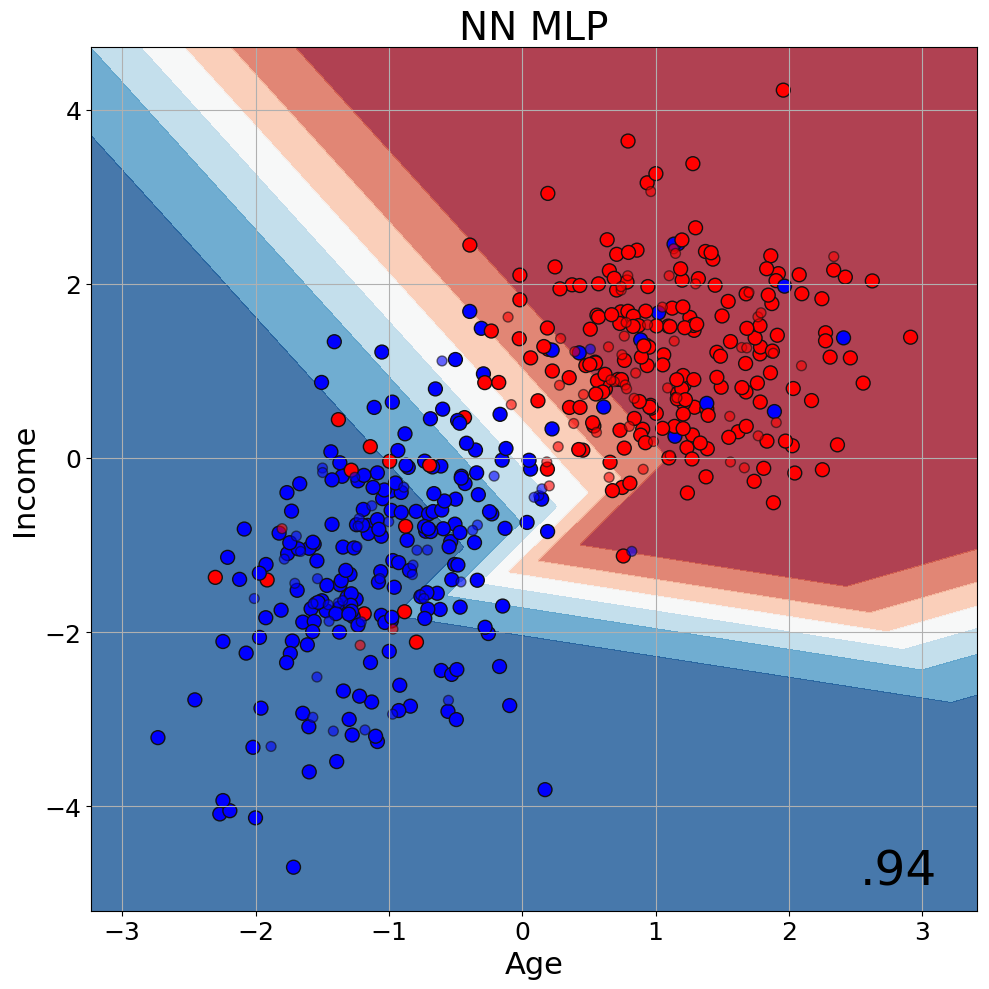

In [55]:
figure = plt.figure(figsize=(10, 10));
ax = plt.subplot(1, 1, 1);
plot_boundaries(X_train, X_test, y_train, y_test, nn_clf, "NN MLP", ax, hide_ticks=False)
ax.set_xlabel("Age", fontsize=22)
ax.set_ylabel("Income", fontsize=22)
plt.tight_layout();
#plt.savefig('out/default-nn-mlp-boundaries.png');

## Experimenting with Mulitple Activation Functions

C:\Users\st50\AppData\Local\Continuum\anaconda3\envs\small_sklearn\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
C:\Users\st50\AppData\Local\Continuum\anaconda3\envs\small_sklearn\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
C:\Users\st50\AppData\Local\Continuum\anaconda3\envs\small_sklearn\lib\site-packages\sklearn

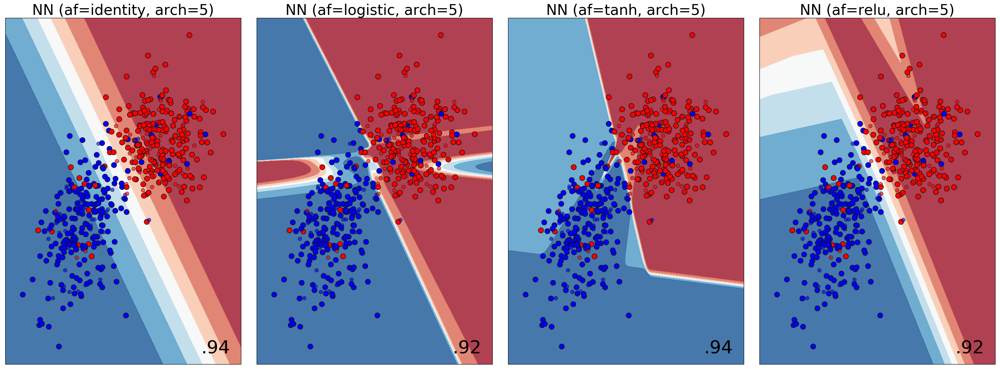

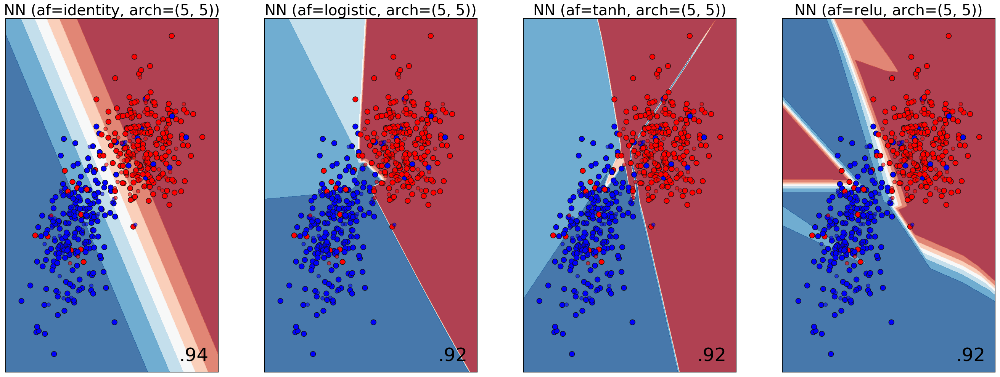

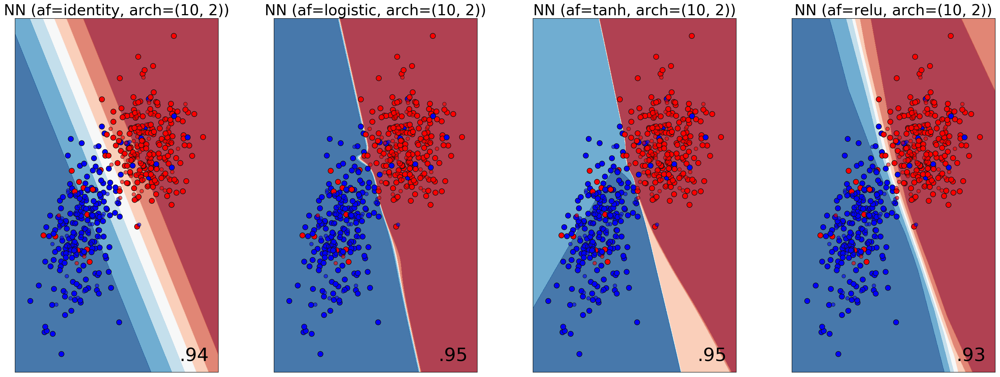

In [56]:
rng = np.random.RandomState(2)

alpha=0.001
archs = [(5), (5, 5), (10, 2)]
afs = ['identity', 'logistic', 'tanh', 'relu']

j = 1

for arch in archs:
    figure = plt.figure(figsize=(27, 10));
    i = 1
    
    for af in afs:
        ax = plt.subplot(1, 4, i);
        clf_tmp = MLPClassifier(solver='lbfgs', activation=af, alpha=alpha, hidden_layer_sizes=arch, random_state=1);
        clf_tmp = clf_tmp.fit(X_train, y_train);
        plot_boundaries(X_train, X_test, y_train, y_test, clf_tmp, "NN (af={}, arch={})".format(af, arch, alpha), ax, hide_ticks=True);
        i += 1
        
    plt.tight_layout();
    #plt.savefig('out/default-nn-arch-{:d}-af.png'.format(j));
    j += 1


## Experimenting with Mulitple Alphas

[1.e-01 1.e-02 1.e-03 1.e-04 1.e-05 1.e-06 1.e-07 1.e-08 1.e-09 1.e-10
 1.e-11]


C:\Users\st50\AppData\Local\Continuum\anaconda3\envs\small_sklearn\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
C:\Users\st50\AppData\Local\Continuum\anaconda3\envs\small_sklearn\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:471: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


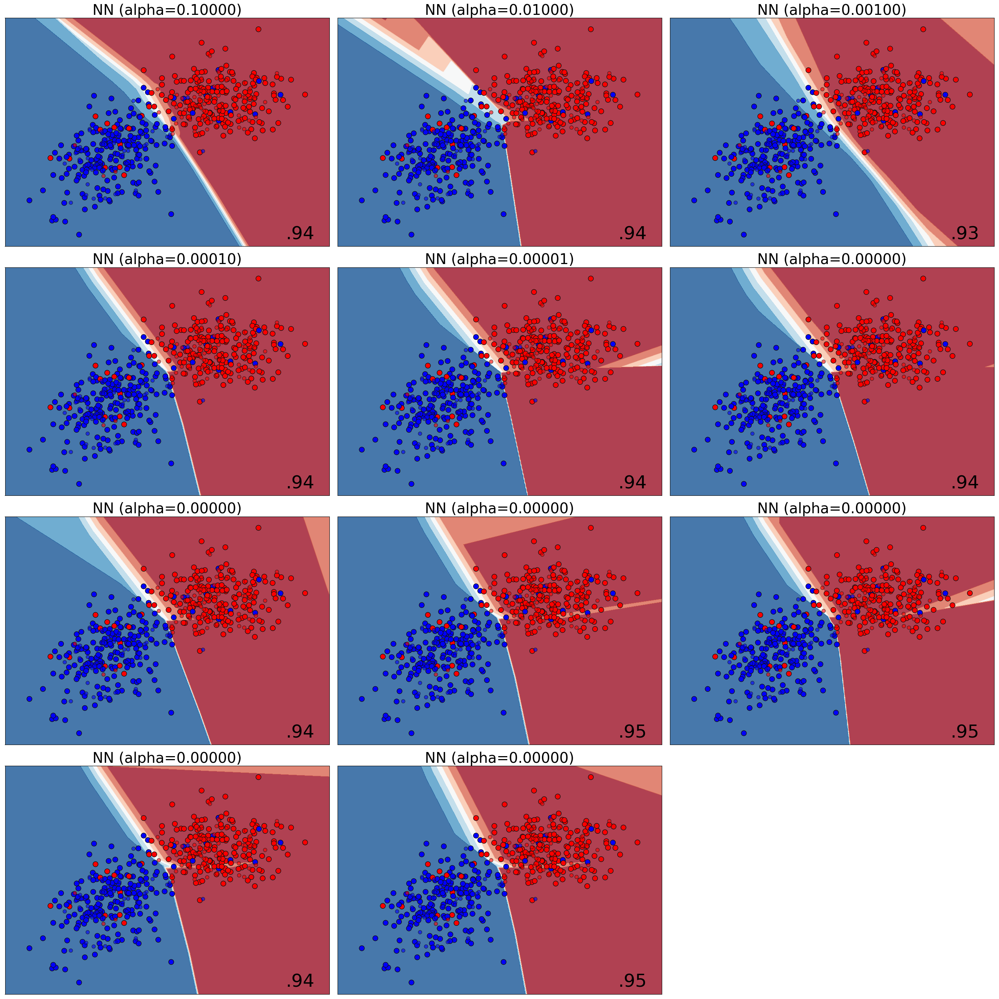

In [57]:
rng = np.random.RandomState(2)

figure = plt.figure(figsize=(27, 27));
i = 1

alphas = 10.0 ** -np.arange(1, 12)
print(alphas)

for alpha in alphas:
    ax = plt.subplot(4, 3, i);
    clf_tmp = MLPClassifier(solver='lbfgs', activation='relu', alpha=alpha, hidden_layer_sizes=(10, 2), random_state=1)
    clf_tmp.fit(X_train, y_train);
    plot_boundaries(X_train, X_test, y_train, y_test, clf_tmp, "NN (alpha={:.5f})".format(alpha), ax, hide_ticks=True);
    i += 1

plt.tight_layout();
#plt.savefig('out/default-nn-all.png');

# Comparing Multiple Algorithms

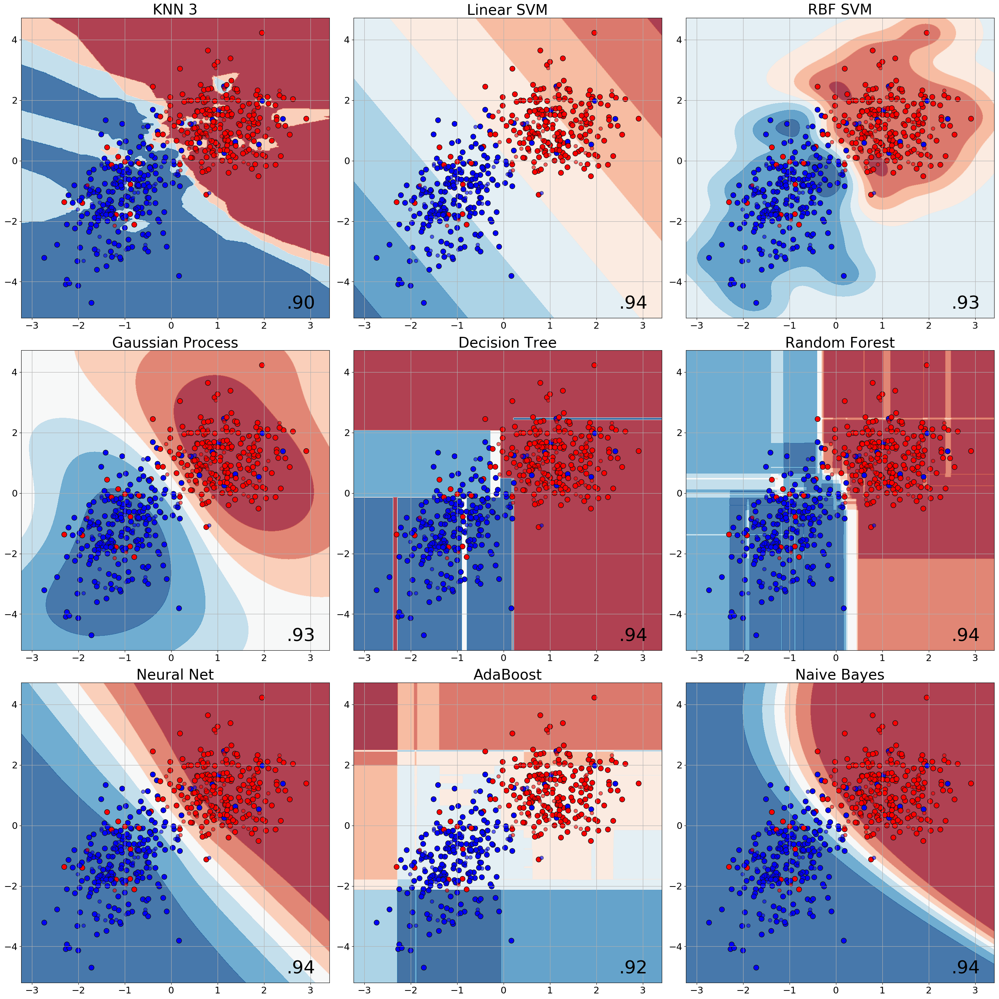

In [58]:
# Inspired by: https://scikit-learn.org/stable/auto_examples/classification/plot_classifier_comparison.html

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import make_moons, make_circles, make_classification
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis


names = ["KNN 3", "Linear SVM", "RBF SVM", "Gaussian Process",
         "Decision Tree", "Random Forest", "Neural Net", "AdaBoost",
         "Naive Bayes"]

classifiers = [
    KNeighborsClassifier(3),
    SVC(kernel="linear", C=0.025),
    SVC(gamma=2, C=1),
    GaussianProcessClassifier(1.0 * RBF(1.0)),
    DecisionTreeClassifier(max_depth=5),
    RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1),
    MLPClassifier(alpha=1),
    AdaBoostClassifier(),
    GaussianNB()]


rng = np.random.RandomState(2)

figure = plt.figure(figsize=(27, 27));
i = 1

# iterate over classifiers
for name, clf_tmp in zip(names, classifiers):
    ax = plt.subplot(3, 3, i);
    clf_tmp.fit(X_train, y_train);
    plot_boundaries(X_train, X_test, y_train, y_test, clf_tmp, name, ax, hide_ticks=False);
    i += 1

plt.tight_layout();
#plt.savefig('out/default-all.png');